# Part 4b,  Modelling for loop: Recreational games  - DO NOT RUN ON OPEN!

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as datetime
from sklearn.preprocessing import StandardScaler

sns.set(font_scale=1.5)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import statsmodels.api as sm  
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox
import scipy.stats as stats

# Standard plotly imports
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
from plotly import tools
import networkx as nx

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)


In [2]:
#import data
all_traffic=pd.read_csv('all_players_modelling_df.csv')
rec_traffic=pd.read_csv('recreational_players_modelling_df.csv')
pros_online=pd.read_csv('pros_online_modelling_df.csv')

In [3]:
#drop unnecessary columns and recast to date time
all_traffic=all_traffic[['date_time','game_count']]
all_traffic['date_time']=all_traffic['date_time'].apply(pd.Timestamp)
all_traffic.set_index('date_time', inplace=True)
all_traffic.columns=['all_games_count']

In [4]:
rec_traffic=rec_traffic[['date_time','game_count']]
rec_traffic['date_time']=rec_traffic['date_time'].apply(pd.Timestamp)
rec_traffic.set_index('date_time', inplace=True)
rec_traffic.columns=['rec_games_count']

In [5]:
pros_online=pros_online[['date_time','pros_online']]
pros_online['date_time']=pros_online['date_time'].apply(pd.Timestamp)
pros_online.set_index('date_time', inplace=True)

In [6]:
#Time series report function
def time_series_report (time_series, model, predictions=None):
    """"""
    
    #Info from model summary 
    report='\n\nSTATESPACE MODEL RESULTS AND DIAGNOSTICS\n'
    for i in (str(model.summary()).split('\n')[1:4]):
        report=report+i+('\n')
    report=report+('\n')
    for i in (str(model.summary()).split('\n')[10:]):
        if i[0]== '=':
            break
        else:
            report=report+i+('\n')
            
    print(report)
    
    #Rerunning models after each updated value is too computationally heavy.
    #Train models on first 80% of sample, test on last 20%
    
    #set test and train
    length_train=round(len(time_series)/5)
    train=time_series[:len(time_series)-length_train]
    test=time_series[len(time_series)-length_train:]
    preds = model.predict( dynamic=False)
    
    
    #Residuals and standardised residuals
    train_resid= model.resid[:len(time_series)-length_train]
    test_resid=model.resid[len(time_series)-length_train:]
    scaler=StandardScaler()
    test_stan_resid=pd.DataFrame(scaler.fit_transform(pd.DataFrame(test_resid)))
    test_stan_resid.index=test_resid.index
    test_stan_resid.columns=['resid_p']
    
    #residuals histogram
    plot_test_residuals=go.Histogram(x=test_resid)
    plot_train_residuals=go.Histogram(x=train_resid)

    #corellogram plot
    correl= pd.Series(acorr_ljungbox(model.resid, lags=10, boxpierce=True)[3])
    plot_correl=go.Bar(x=list(range(1,21)),
                       y=correl)

    #option resample standardised residuals to make clearer
    #test_stan_resid=test_stan_resid.resample('6H').mean()
    
    #standardised residuals line graph
    plot_sr=  go.Scatter(
                        x = test_stan_resid.index,
                        y = test_stan_resid.resid_p,
                        mode = 'lines',
                        name = 'Standardised residuals'
                    )

    fig = tools.make_subplots(rows=2, cols=2, print_grid=False, 
                              subplot_titles=('Train residuals distribution',
                                              'Corellogram - all residuals',
                                              'Test residuals distribution',
                                              'Standardised test residuals'
                                             ))
    
    fig.append_trace(plot_train_residuals, 1, 1)
    fig.append_trace(plot_test_residuals, 2, 1)
    fig.append_trace(plot_correl, 1, 2)
    fig.append_trace(plot_sr, 2, 2)
    fig['layout']['yaxis2'].update(title='P-value', range=[0, 1])
    fig['layout'].update(showlegend=False, title='DIAGNOSTICS')
    iplot(fig)
    
    print('QUANTILE PLOT - ALL RESIDUALS')
    fig = sm.qqplot(model.resid, stats.norm, fit=True, line='45')
    plt.show()
    return 

In [7]:
def baseline_vs_model(time_series, model):
    #uses mean of test set for all predictions
    
    #if option for resample is needed at arguement for resample in function
    #time_series=time_series.resample(resample).sum()
    
    length_train=round(len(time_series)/5)
    train=time_series[:len(time_series)-length_train]
    test = time_series[len(time_series)-length_train:]
    
    pred=[train.mean()]*(len(time_series)-length_train)
    
    train_mse=round(mean_squared_error(train, pred),4)
    train_mae=round(mean_absolute_error(train, pred),4)
    train_r2=round(r2_score(train, pred),4)
    
    pred=[train.mean()]*length_train
    test_mse=round(mean_squared_error(test, pred),4)
    test_mae=round(mean_absolute_error(test, pred),4)
    test_r2=round(r2_score(test, pred),4)
    data={'Base_train': [train_mse, train_mae, train_r2], 
          'Base_test': [test_mse, test_mae, test_r2 ]}
    
    #model predictions
    preds = model.predict(dynamic=False)
    
    #model test scores
    train_preds=preds[:len(time_series)-length_train]
    train_mse=round(mean_squared_error(train, train_preds),4)
    train_mae=round(mean_absolute_error(train, train_preds),4)
    train_r2=round(r2_score(train, train_preds),4)
    data['Model_train']=[train_mse, train_mae, train_r2]
    
    #model test scores
    test_preds=preds[len(time_series)-length_train:]
    test_mse=round(mean_squared_error(test, test_preds),4)
    test_mae=round(mean_absolute_error(test, test_preds),4)
    test_r2=round(r2_score(test, test_preds),4)
    data['Model_test']=[test_mse, test_mae, test_r2 ]
    
    data=pd.DataFrame(data)
    data.index=['MSE', 'MAE', 'R^2']

    
    print(data)
    return data

In [8]:
def model_test(time_series, olag, oma, solag, soma, season, freq):
    """ time_series= column used for prediction
    olag= order lag
    oma=order moving average
    solag=seasonal order lag
    soma = seasonal order moving average
    season = seasons component - should be day or week
    freq= frequency for resample, same as input for resample function"""
    time_series=time_series.resample(freq).sum()
        
    length_train=round(len(time_series)/5)
    train=time_series[:len(time_series)-length_train]

    #obtain model parameters using training set
    tmodel = sm.tsa.statespace.SARIMAX(train,
                                      order=(olag, 0, oma),
                                      seasonal_order=(solag, 0, soma, season),
                                      freq=freq)
    results = tmodel.fit(max_iter=1000)

    #use previous model parameters, add test set to sata to allow for predictions
    model = sm.tsa.statespace.SARIMAX(time_series,
                                      order=(olag, 0, oma),
                                      seasonal_order=(solag, 0, soma, season),
                                     freq=freq)
    final_model=model.filter(results.params)
    
    baseline_vs_model(time_series, final_model)
    
    time_series_report(time_series, final_model)
    
    return final_model

## For loop

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     142.6152    106.3451
MAE     11.3302    10.7925       9.1733      8.1004
R^2      0.0000    -0.1158       0.3228      0.2858


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 24)   Log Likelihood              -29283.458

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6739      0.012     54.474      0.000       0.650       0.698
ma.L1         -0.2812      0.015    -19.024      0.000      -0.310      -0.252
ar.S.L24       0.9998   7.88e-05   1.27e+04      0.000       1.000       1.000
ma.S.L24      -0.9786      0.003   -329.070      0.000      -0.984      -0.973
sigma2       139.5418      1.919     72.702      0.000     135.780     143.304



QUANTILE PLOT - ALL RESIDUALS


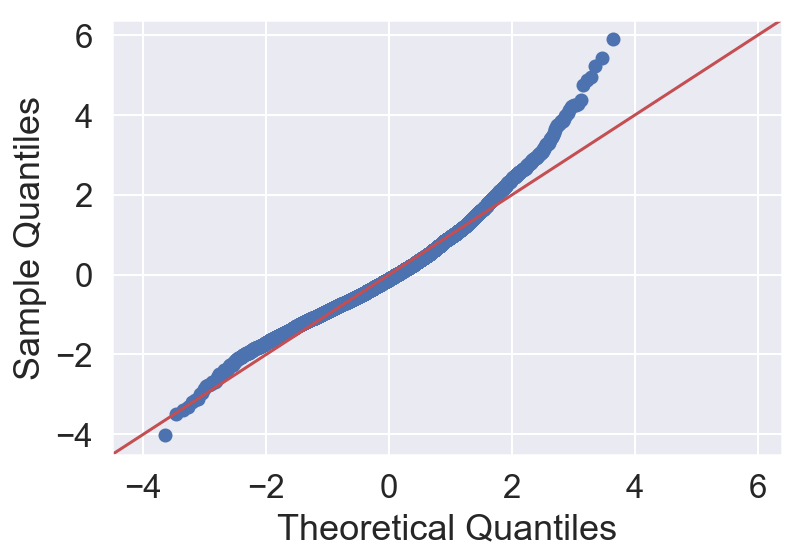

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     142.3696    106.0702
MAE     11.3302    10.7925       9.1633      8.0796
R^2      0.0000    -0.1158       0.3240      0.2877


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(1, 0, 2, 24)   Log Likelihood              -29279.109

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6728      0.017     40.197      0.000       0.640       0.706
ma.L1         -0.2758      0.022    -12.799      0.000      -0.318      -0.234
ar.S.L24       0.9998   8.32e-05    1.2e+04      0.000       1.000       1.000
ma.S.L24      -0.9418      0.011    -86.800      0.000      -0.963      -0.920
ma.S.L48      -0.0369      0.011     -3.408      0.001      -0.058      -0.016
sigma2       

QUANTILE PLOT - ALL RESIDUALS


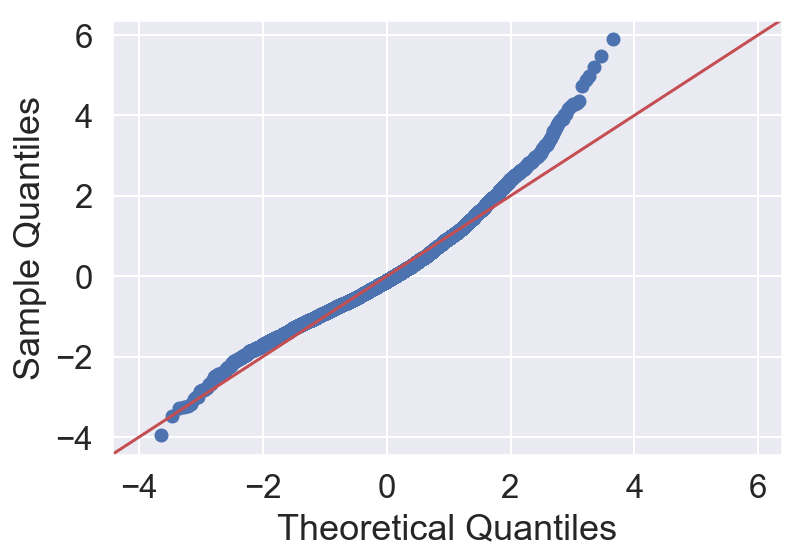

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     142.3650    106.2737
MAE     11.3302    10.7925       9.1531      8.0706
R^2      0.0000    -0.1158       0.3240      0.2863


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(2, 0, 1, 24)   Log Likelihood              -29280.879

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6803      0.016     41.505      0.000       0.648       0.712
ma.L1         -0.2851      0.021    -13.396      0.000      -0.327      -0.243
ar.S.L24       1.0411      0.012     90.031      0.000       1.018       1.064
ar.S.L48      -0.0415      0.012     -3.593      0.000      -0.064      -0.019
ma.S.L24      -0.9764      0.003   -287.125      0.000      -0.983      -0.970
sigma2       

QUANTILE PLOT - ALL RESIDUALS


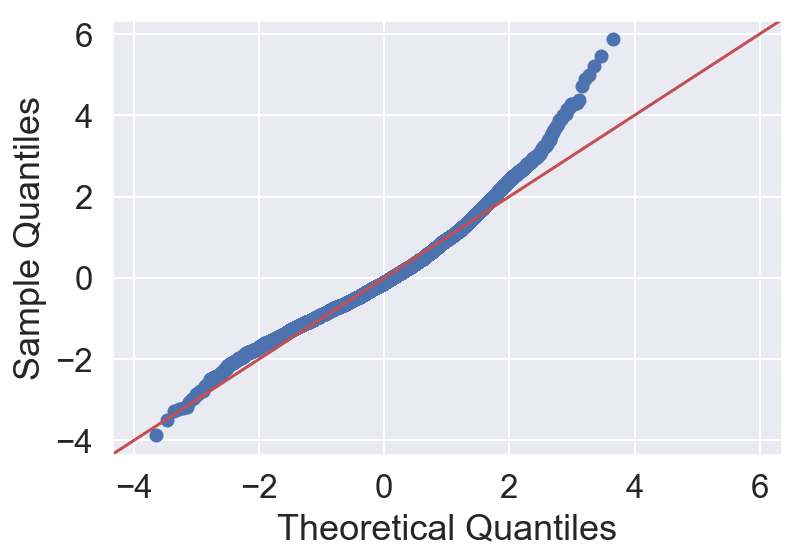

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     142.5894    106.4836
MAE     11.3302    10.7925       9.1712      8.1010
R^2      0.0000    -0.1158       0.3230      0.2849


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(2, 0, 2, 24)   Log Likelihood              -29284.491

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6798      0.016     41.693      0.000       0.648       0.712
ma.L1         -0.2832      0.021    -13.372      0.000      -0.325      -0.242
ar.S.L24       0.0278      0.016      1.733      0.083      -0.004       0.059
ar.S.L48       0.9717      0.016     60.941      0.000       0.940       1.003
ma.S.L24      -0.0069      0.016     -0.433      0.665      -0.038       0.024
ma.S.L48     

QUANTILE PLOT - ALL RESIDUALS


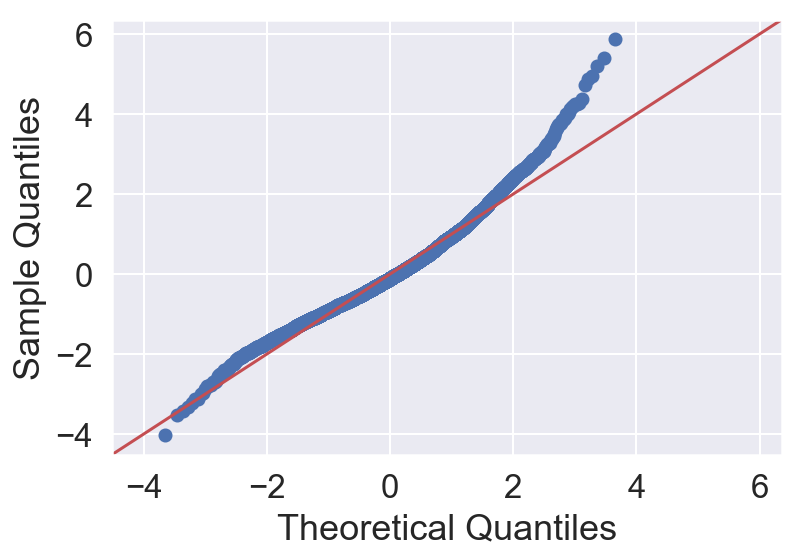

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.6450    105.6796
MAE     11.3302    10.7925       9.1467      8.0891
R^2      0.0000    -0.1158       0.3275      0.2903


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(1, 0, 1, 24)   Log Likelihood              -29262.233

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8190      0.018     44.818      0.000       0.783       0.855
ma.L1         -0.4117      0.022    -18.968      0.000      -0.454      -0.369
ma.L2         -0.1193      0.015     -7.830      0.000      -0.149      -0.089
ar.S.L24       0.9996      0.000   7509.227      0.000       0.999       1.000
ma.S.L24      -0.9760      0.003   -298.445      0.000      -0.982      -0.970
sigma2       

QUANTILE PLOT - ALL RESIDUALS


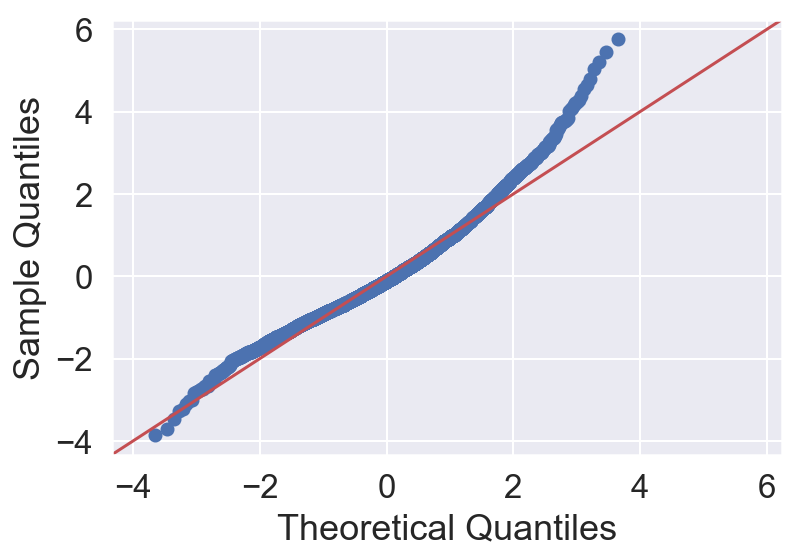

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.4234    105.4617
MAE     11.3302    10.7925       9.1358      8.0687
R^2      0.0000    -0.1158       0.3285      0.2918


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(1, 0, 2, 24)   Log Likelihood              -29257.103

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8224      0.018     45.628      0.000       0.787       0.858
ma.L1         -0.4170      0.022    -19.342      0.000      -0.459      -0.375
ma.L2         -0.1210      0.016     -7.767      0.000      -0.152      -0.090
ar.S.L24       0.9995      0.000   6510.124      0.000       0.999       1.000
ma.S.L24      -0.9384      0.011    -83.085      0.000      -0.961      -0.916
ma.S.L48     

QUANTILE PLOT - ALL RESIDUALS


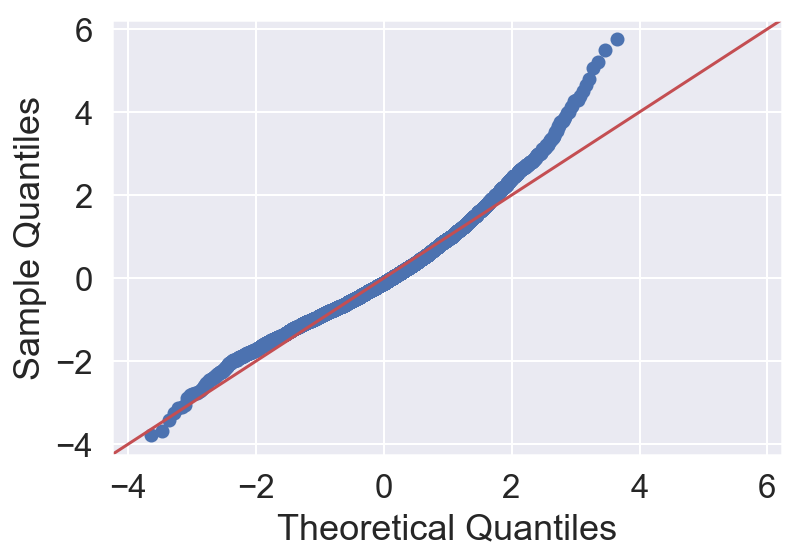

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.4203    105.4697
MAE     11.3302    10.7925       9.1360      8.0695
R^2      0.0000    -0.1158       0.3285      0.2917


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(2, 0, 1, 24)   Log Likelihood              -29257.178

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8231      0.018     45.789      0.000       0.788       0.858
ma.L1         -0.4178      0.022    -19.368      0.000      -0.460      -0.376
ma.L2         -0.1214      0.015     -7.906      0.000      -0.151      -0.091
ar.S.L24       1.0364      0.011     93.926      0.000       1.015       1.058
ar.S.L48      -0.0369      0.011     -3.344      0.001      -0.059      -0.015
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


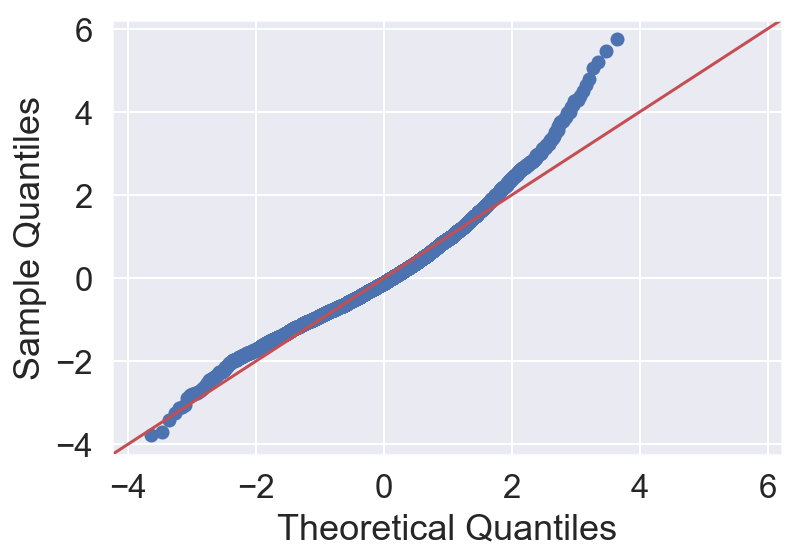

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     142.4333    105.0874
MAE     11.3302    10.7925       9.2140      8.1244
R^2      0.0000    -0.1158       0.3237      0.2943


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(2, 0, 2, 24)   Log Likelihood              -29281.359

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8687      0.007    128.876      0.000       0.856       0.882
ma.L1         -0.4675      0.010    -45.697      0.000      -0.488      -0.447
ma.L2         -0.1855      0.002    -90.647      0.000      -0.190      -0.181
ar.S.L24       0.0144      0.002      5.857      0.000       0.010       0.019
ar.S.L48       0.9854      0.002    399.137      0.000       0.981       0.990
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


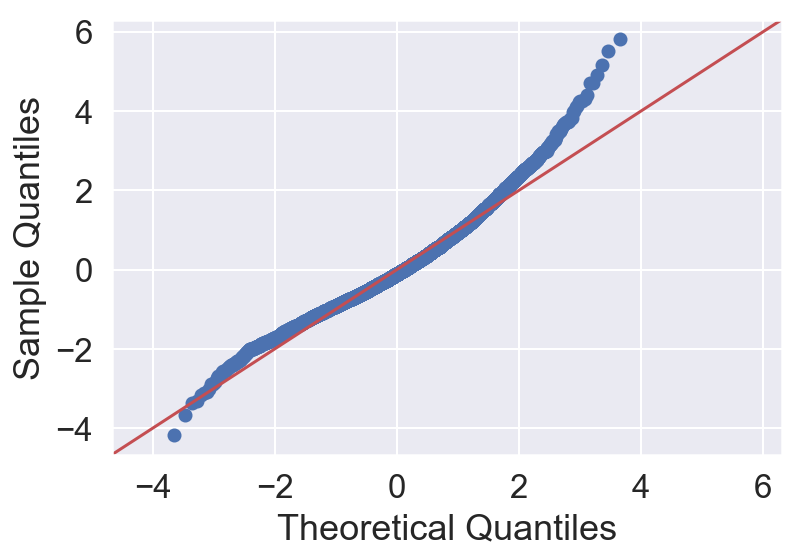

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.2336    105.3998
MAE     11.3302    10.7925       9.1271      8.0541
R^2      0.0000    -0.1158       0.3294      0.2922


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(1, 0, 1, 24)   Log Likelihood              -29260.016

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4013      0.012    112.111      0.000       1.377       1.426
ar.L2         -0.4064      0.011    -35.681      0.000      -0.429      -0.384
ma.L1         -0.9591      0.007   -140.606      0.000      -0.972      -0.946
ar.S.L24       0.9983      0.001   1873.142      0.000       0.997       0.999
ma.S.L24      -0.9779      0.004   -278.888      0.000      -0.985      -0.971
sigma2       

QUANTILE PLOT - ALL RESIDUALS


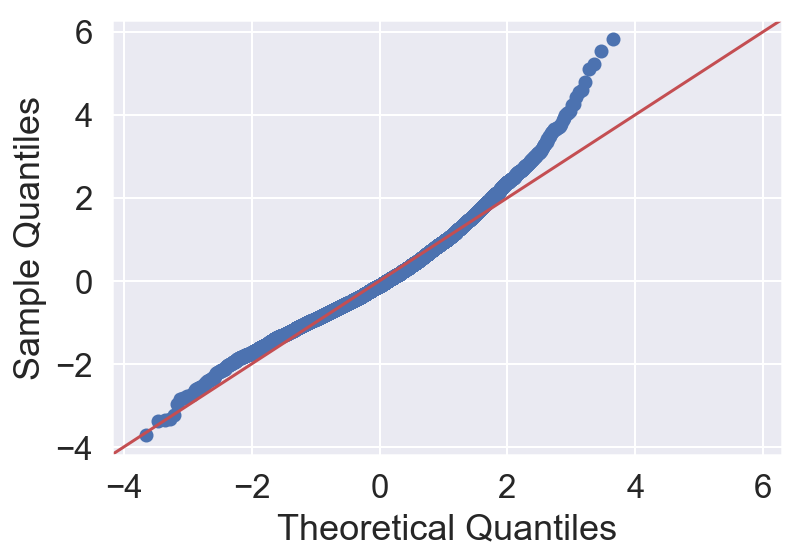

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.1542    105.2065
MAE     11.3302    10.7925       9.1232      8.0427
R^2      0.0000    -0.1158       0.3298      0.2935


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(1, 0, 2, 24)   Log Likelihood              -29258.176

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3946      0.013    108.759      0.000       1.369       1.420
ar.L2         -0.4000      0.012    -34.029      0.000      -0.423      -0.377
ma.L1         -0.9592      0.007   -142.175      0.000      -0.972      -0.946
ar.S.L24       0.9983      0.001   1787.385      0.000       0.997       0.999
ma.S.L24      -0.9565      0.008   -115.429      0.000      -0.973      -0.940
ma.S.L48     

QUANTILE PLOT - ALL RESIDUALS


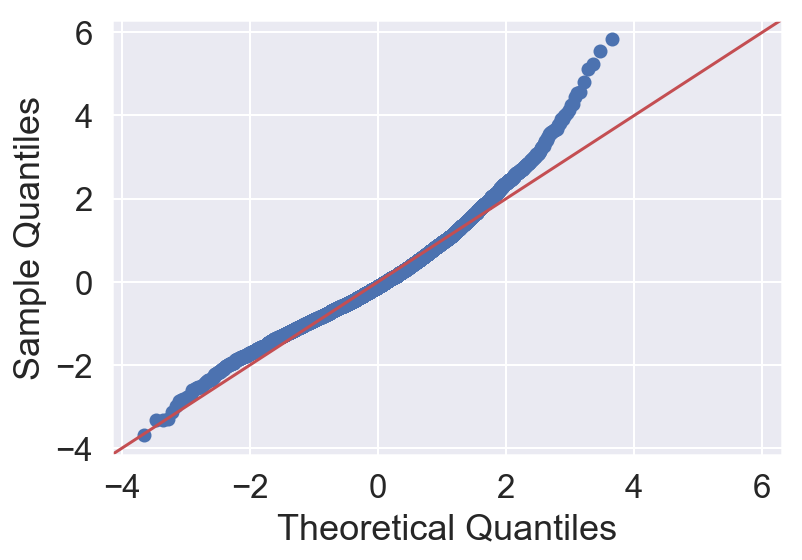

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.1357    105.0723
MAE     11.3302    10.7925       9.1243      8.0422
R^2      0.0000    -0.1158       0.3299      0.2944


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(2, 0, 1, 24)   Log Likelihood              -29255.913

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3992      0.013    110.633      0.000       1.374       1.424
ar.L2         -0.4043      0.012    -34.978      0.000      -0.427      -0.382
ma.L1         -0.9634      0.007   -146.219      0.000      -0.976      -0.950
ar.S.L24       1.0166      0.003    317.792      0.000       1.010       1.023
ar.S.L48      -0.0179      0.003     -5.872      0.000      -0.024      -0.012
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


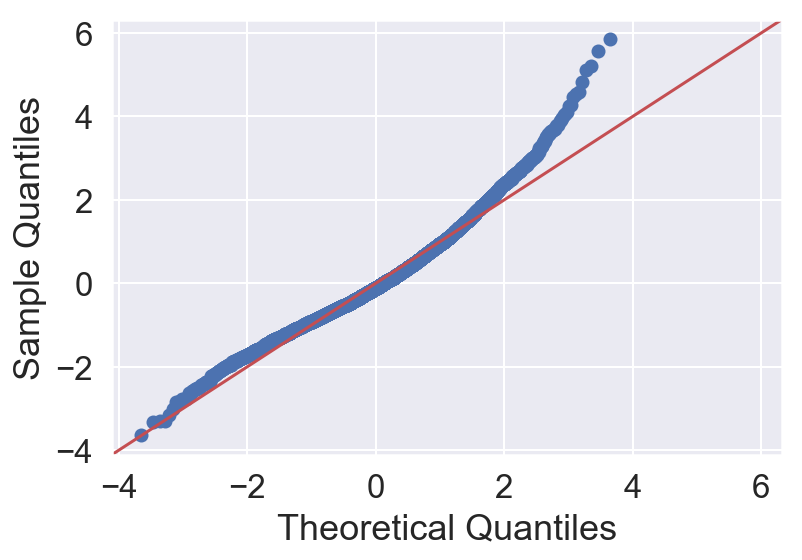

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.2646    105.3667
MAE     11.3302    10.7925       9.1241      8.0661
R^2      0.0000    -0.1158       0.3293      0.2924


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(2, 0, 2, 24)   Log Likelihood              -29260.200

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3663      0.015     89.744      0.000       1.336       1.396
ar.L2         -0.3780      0.013    -29.003      0.000      -0.404      -0.352
ma.L1         -0.9367      0.010    -94.892      0.000      -0.956      -0.917
ar.S.L24       0.0854      0.009      9.557      0.000       0.068       0.103
ar.S.L48       0.9124      0.009    100.493      0.000       0.895       0.930
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


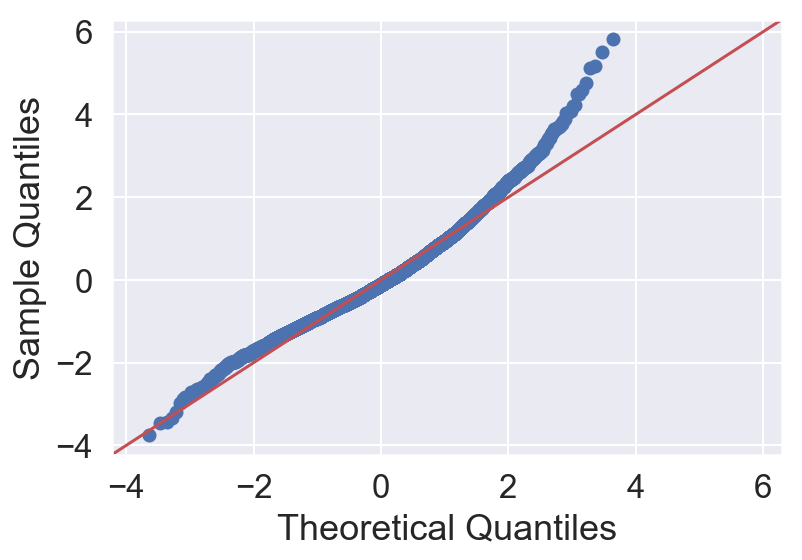

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.1302    106.0407
MAE     11.3302    10.7925       9.0988      8.0537
R^2      0.0000    -0.1158       0.3299      0.2879


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(1, 0, 1, 24)   Log Likelihood              -29263.275

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4644      0.016     93.484      0.000       1.434       1.495
ar.L2         -0.4755      0.013    -36.995      0.000      -0.501      -0.450
ma.L1         -1.0511      0.014    -73.463      0.000      -1.079      -1.023
ma.L2          0.1082      0.009     12.621      0.000       0.091       0.125
ar.S.L24       0.9977      0.001   1510.230      0.000       0.996       0.999
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


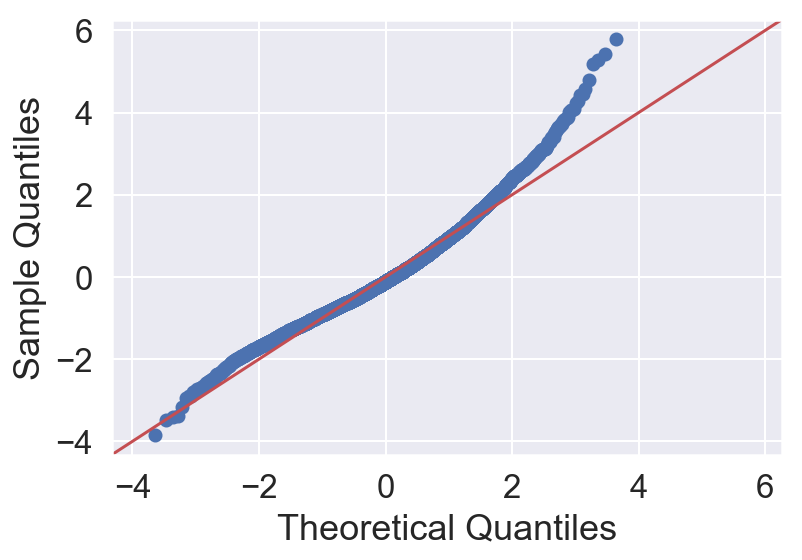

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     140.6523    105.5967
MAE     11.3302    10.7925       9.0983      8.0471
R^2      0.0000    -0.1158       0.3322      0.2909


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(1, 0, 2, 24)   Log Likelihood              -29247.663

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5237      0.026     57.919      0.000       1.472       1.575
ar.L2         -0.5302      0.025    -21.280      0.000      -0.579      -0.481
ma.L1         -1.1175      0.029    -39.147      0.000      -1.173      -1.062
ma.L2          0.1536      0.024      6.418      0.000       0.107       0.200
ar.S.L24       0.9989      0.000   2540.768      0.000       0.998       1.000
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


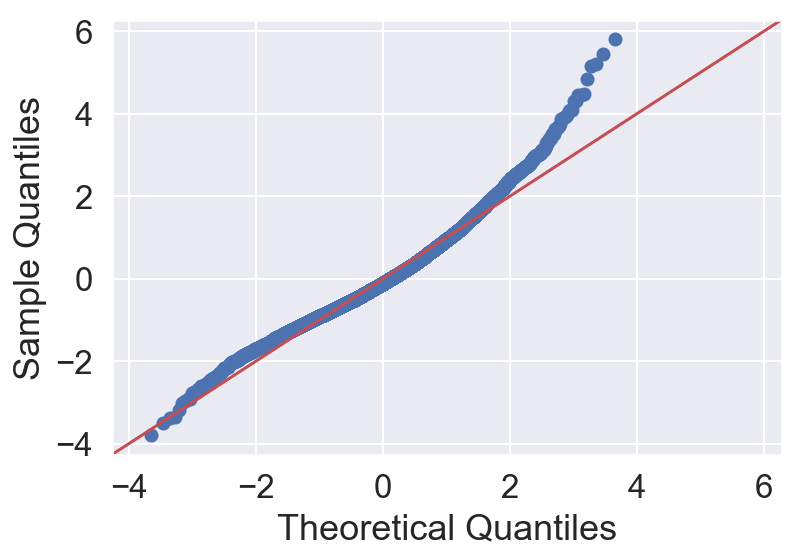

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     140.9924    105.9371
MAE     11.3302    10.7925       9.0920      8.0384
R^2      0.0000    -0.1158       0.3306      0.2886


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(2, 0, 1, 24)   Log Likelihood              -29258.727

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5344      0.035     43.937      0.000       1.466       1.603
ar.L2         -0.5443      0.032    -16.899      0.000      -0.607      -0.481
ma.L1         -1.1336      0.038    -30.033      0.000      -1.208      -1.060
ma.L2          0.1749      0.030      5.913      0.000       0.117       0.233
ar.S.L24       1.0248      0.002    411.310      0.000       1.020       1.030
ar.S.L48     

QUANTILE PLOT - ALL RESIDUALS


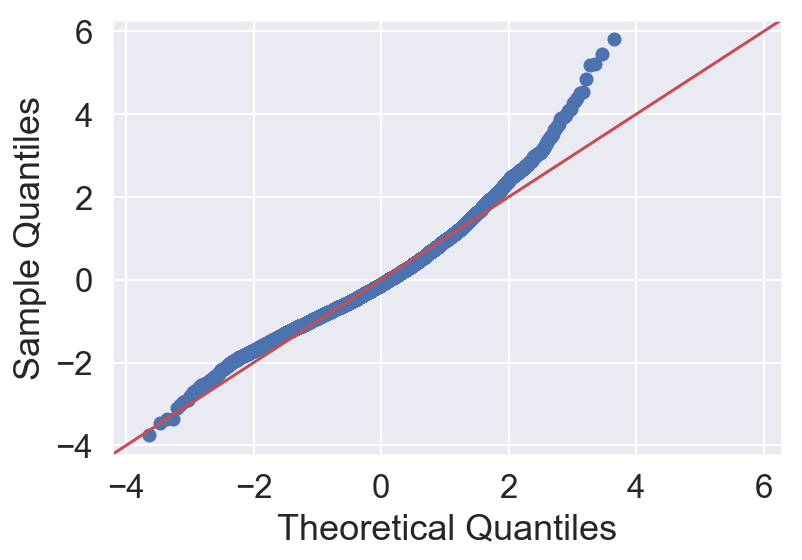

     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     141.1786    105.4687
MAE     11.3302    10.7925       9.1266      8.0704
R^2      0.0000    -0.1158       0.3297      0.2917


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(2, 0, 2, 24)   Log Likelihood              -29253.846

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4425      0.039     37.221      0.000       1.367       1.518
ar.L2         -0.4665      0.033    -14.190      0.000      -0.531      -0.402
ma.L1         -1.0377      0.039    -26.487      0.000      -1.115      -0.961
ma.L2          0.1173      0.025      4.725      0.000       0.069       0.166
ar.S.L24       0.0511      0.004     14.011      0.000       0.044       0.058
ar.S.L48     

QUANTILE PLOT - ALL RESIDUALS


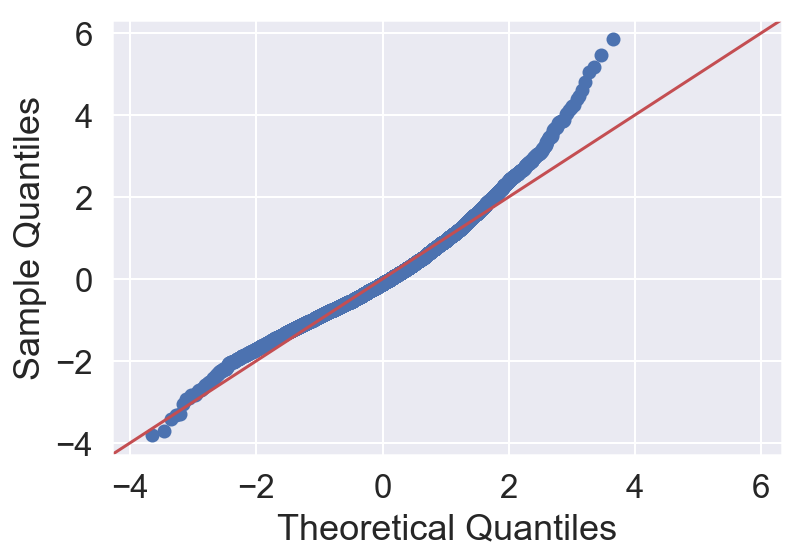

In [ ]:
season=24
frequency='H'
lag=[1,2]
ma=[1,2]

for i in lag:
    for j in ma:
        for k in lag:
            for l in ma:
                try:
                    model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILD')


     Base_train  Base_test  Model_train  Model_test
MSE    210.6099   166.1469     150.9795    104.4960
MAE     11.3302    10.7925       9.3436      7.9365
R^2      0.0000    -0.1158       0.2831      0.2983


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                     rec_games_count   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 168)   Log Likelihood              -29409.664

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7695      0.013     57.603      0.000       0.743       0.796
ma.L1         -0.3942      0.019    -20.618      0.000      -0.432      -0.357
ar.S.L168      0.9965      0.001   1322.594      0.000       0.995       0.998
ma.S.L168     -0.9240      0.008   -119.550      0.000      -0.939      -0.909
sigma2       141.0037      2.065     68.298      0.000     136.957     145.050



QUANTILE PLOT - ALL RESIDUALS


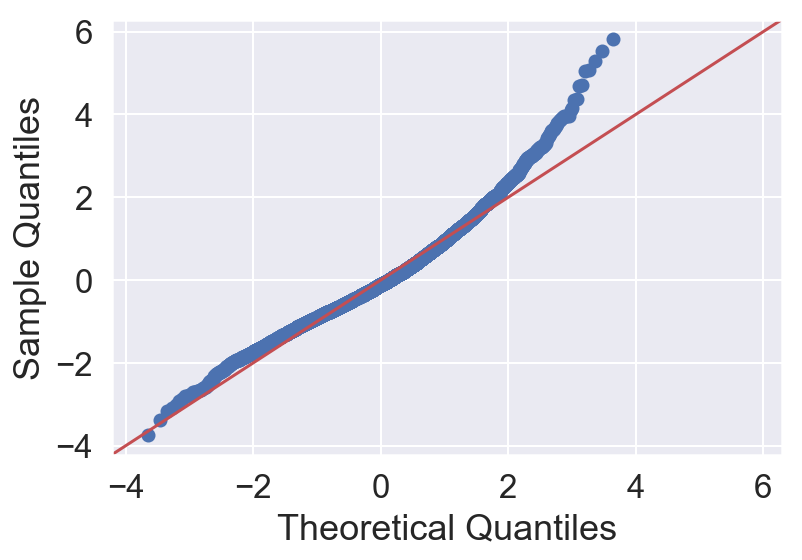

1 1 1 2 PARAMETERS FAILED


In [ ]:
season=168
frequency='H'
lag=[1,2]
ma=[1,2]

for i in lag:
    for j in ma:
        for k in lag:
            for l in ma:
                try:
                    model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILED')

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     424.4971    346.9000
MAE     19.8384    19.2567      15.9303     14.6734
R^2      0.0000    -0.1544       0.3345      0.2283


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 12)   Log Likelihood              -16734.972

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5833      0.028     20.680      0.000       0.528       0.639
ma.L1         -0.1834      0.035     -5.249      0.000      -0.252      -0.115
ar.S.L12       0.9997      0.000   6943.220      0.000       0.999       1.000
ma.S.L12      -0.9666      0.005   -188.091      0.000      -0.977      -0.957
sigma2       416.7354      8.463     49.242      0.000     400.148     433.322



QUANTILE PLOT - ALL RESIDUALS


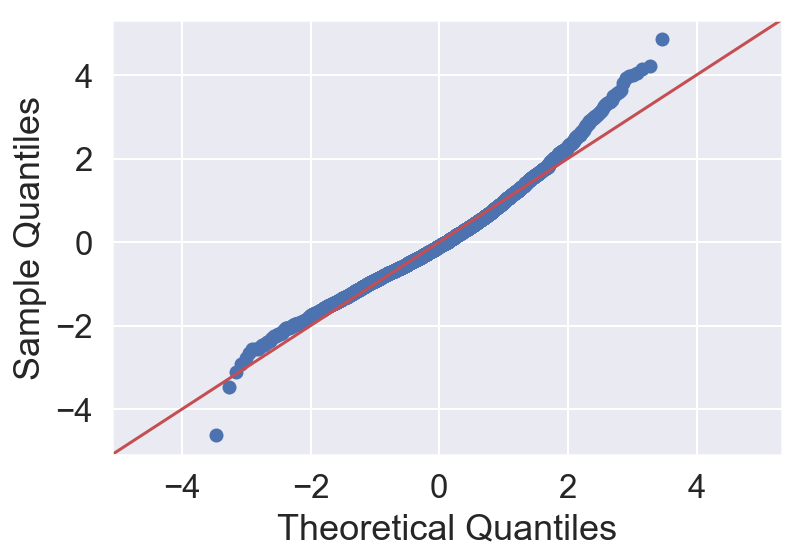

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     422.8687    346.1338
MAE     19.8384    19.2567      15.8961     14.6267
R^2      0.0000    -0.1544       0.3370      0.2300


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 1)x(1, 0, 2, 12)   Log Likelihood              -16728.410

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5835      0.028     20.551      0.000       0.528       0.639
ma.L1         -0.1872      0.035     -5.341      0.000      -0.256      -0.119
ar.S.L12       0.9997      0.000   6958.424      0.000       0.999       1.000
ma.S.L12      -0.9076      0.017    -54.504      0.000      -0.940      -0.875
ma.S.L24      -0.0605      0.017     -3.621      0.000      -0.093      -0.028
sigma2       

QUANTILE PLOT - ALL RESIDUALS


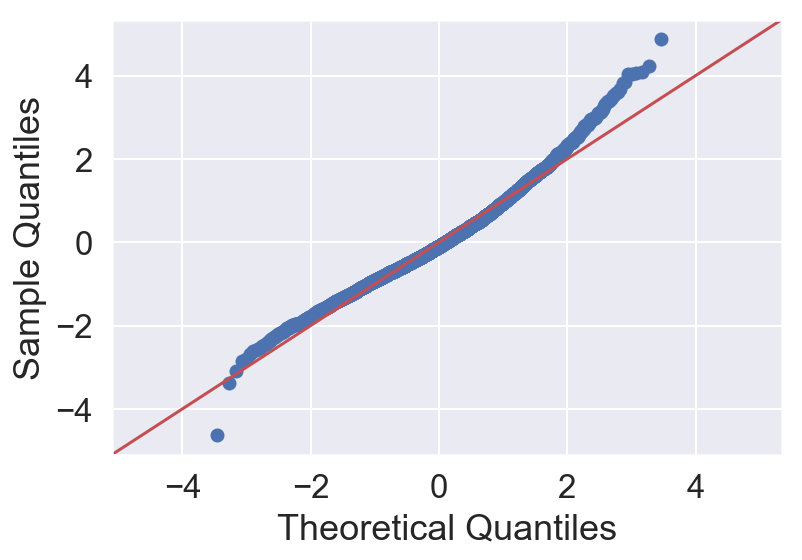

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     422.8200    346.1683
MAE     19.8384    19.2567      15.8943     14.6258
R^2      0.0000    -0.1544       0.3371      0.2300


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 1)x(2, 0, 1, 12)   Log Likelihood              -16728.303

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5837      0.028     20.573      0.000       0.528       0.639
ma.L1         -0.1875      0.035     -5.352      0.000      -0.256      -0.119
ar.S.L12       1.0630      0.017     61.569      0.000       1.029       1.097
ar.S.L24      -0.0633      0.017     -3.670      0.000      -0.097      -0.029
ma.S.L12      -0.9703      0.005   -186.675      0.000      -0.980      -0.960
sigma2       

QUANTILE PLOT - ALL RESIDUALS


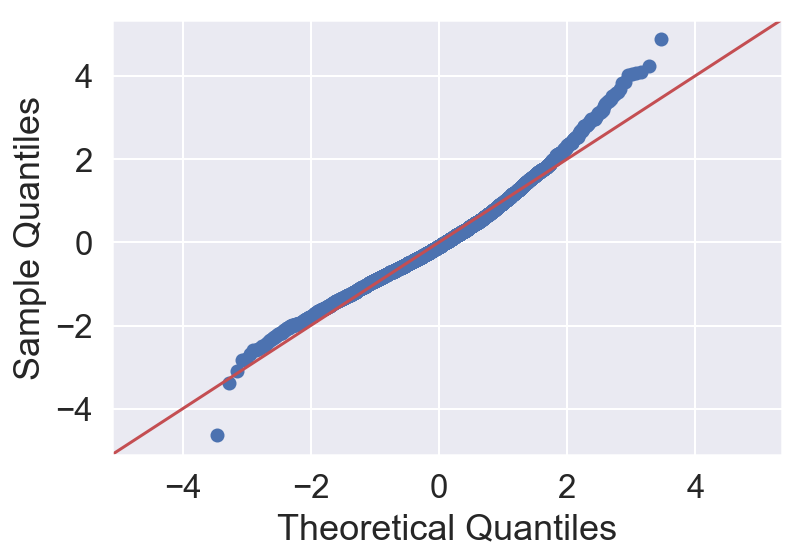

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     424.4762    346.8257
MAE     19.8384    19.2567      15.9367     14.6783
R^2      0.0000    -0.1544       0.3345      0.2285


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 1)x(2, 0, 2, 12)   Log Likelihood              -16734.796

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5828      0.028     20.586      0.000       0.527       0.638
ma.L1         -0.1826      0.035     -5.213      0.000      -0.251      -0.114
ar.S.L12       0.0367      0.204      0.180      0.857      -0.364       0.437
ar.S.L24       0.9628      0.204      4.718      0.000       0.563       1.363
ma.S.L12      -0.0054      0.205     -0.026      0.979      -0.407       0.396
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


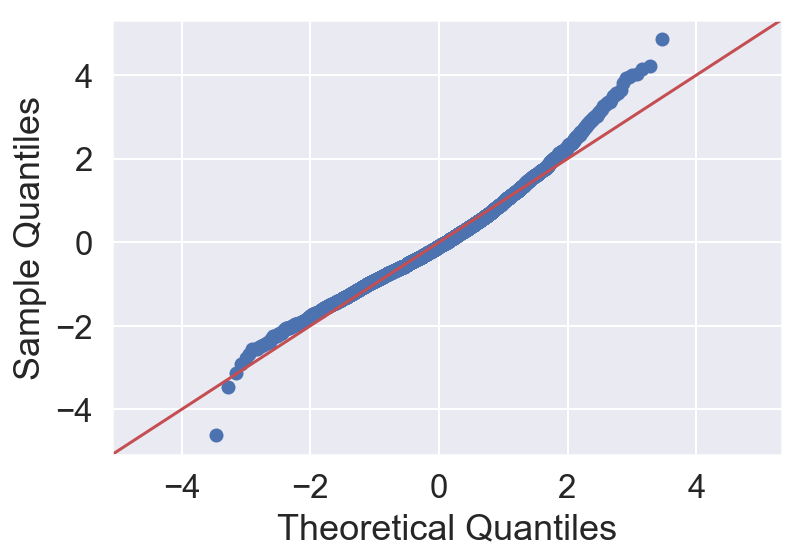

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     423.3685    347.2138
MAE     19.8384    19.2567      15.8995     14.7006
R^2      0.0000    -0.1544       0.3362      0.2276


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 2)x(1, 0, 1, 12)   Log Likelihood              -16731.992

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7312      0.044     16.617      0.000       0.645       0.817
ma.L1         -0.3324      0.048     -6.952      0.000      -0.426      -0.239
ma.L2         -0.0960      0.027     -3.531      0.000      -0.149      -0.043
ar.S.L12       0.9996      0.000   6104.783      0.000       0.999       1.000
ma.S.L12      -0.9664      0.005   -186.400      0.000      -0.977      -0.956
sigma2       

QUANTILE PLOT - ALL RESIDUALS


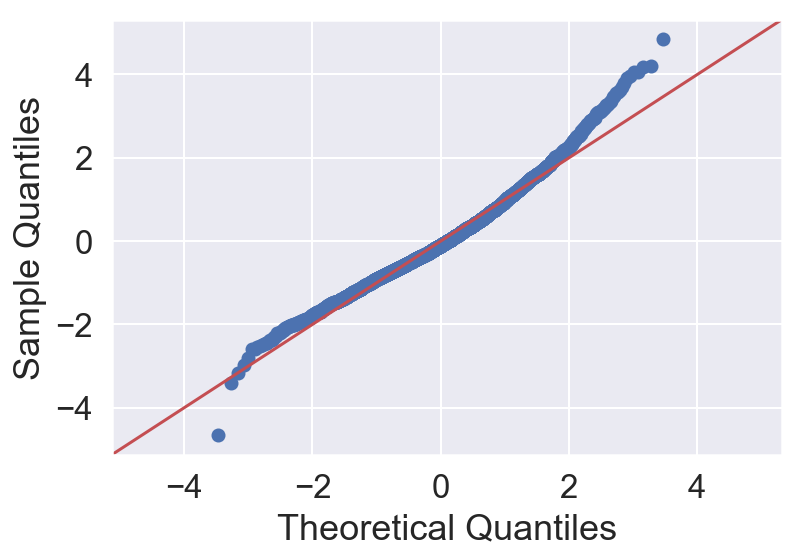

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     421.9041    346.6889
MAE     19.8384    19.2567      15.8715     14.6573
R^2      0.0000    -0.1544       0.3385      0.2288


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 2)x(1, 0, 2, 12)   Log Likelihood              -16728.725

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7460      0.043     17.348      0.000       0.662       0.830
ma.L1         -0.3472      0.047     -7.402      0.000      -0.439      -0.255
ma.L2         -0.0986      0.027     -3.631      0.000      -0.152      -0.045
ar.S.L12       0.9996      0.000   5386.777      0.000       0.999       1.000
ma.S.L12      -0.9124      0.017    -53.307      0.000      -0.946      -0.879
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


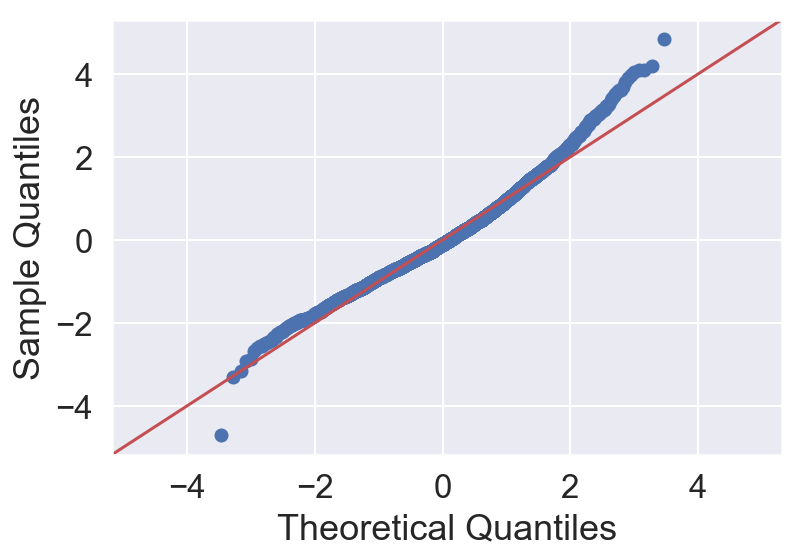

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     421.8386    347.0265
MAE     19.8384    19.2567      15.8721     14.6624
R^2      0.0000    -0.1544       0.3386      0.2281


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 2)x(2, 0, 1, 12)   Log Likelihood              -16728.107

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7401      0.043     17.255      0.000       0.656       0.824
ma.L1         -0.3393      0.047     -7.240      0.000      -0.431      -0.247
ma.L2         -0.0995      0.027     -3.694      0.000      -0.152      -0.047
ar.S.L12       1.0586      0.018     59.980      0.000       1.024       1.093
ar.S.L24      -0.0590      0.018     -3.348      0.001      -0.094      -0.024
ma.S.L12     

QUANTILE PLOT - ALL RESIDUALS


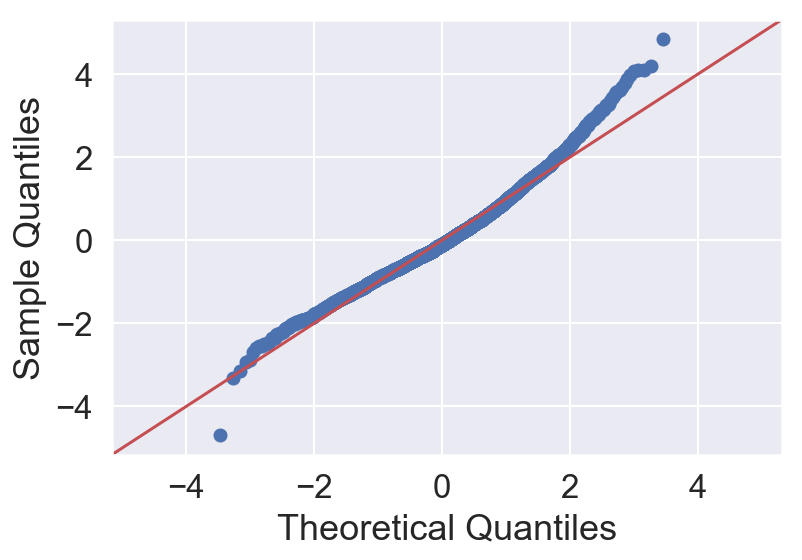

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     426.5080    347.5315
MAE     19.8384    19.2567      15.8859     14.8072
R^2      0.0000    -0.1544       0.3313      0.2269


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(1, 0, 2)x(2, 0, 2, 12)   Log Likelihood              -16746.287

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9441      0.014     66.132      0.000       0.916       0.972
ma.L1         -0.5893      0.020    -29.063      0.000      -0.629      -0.550
ma.L2         -0.2440      0.018    -13.799      0.000      -0.279      -0.209
ar.S.L12       0.0385      0.022      1.784      0.074      -0.004       0.081
ar.S.L24       0.9609      0.021     44.762      0.000       0.919       1.003
ma.S.L12     

QUANTILE PLOT - ALL RESIDUALS


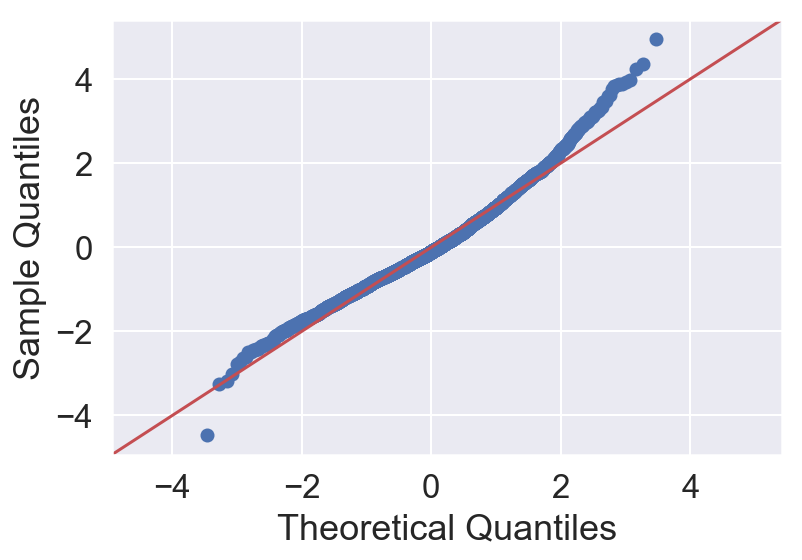

2 1 1 1 PARAMETERS FAILED
2 1 1 2 PARAMETERS FAILED
2 1 2 1 PARAMETERS FAILED
2 1 2 2 PARAMETERS FAILED
     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     419.5714    348.6425
MAE     19.8384    19.2567      15.7456     14.6507
R^2      0.0000    -0.1544       0.3422      0.2245


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(2, 0, 2)x(1, 0, 1, 12)   Log Likelihood              -16723.184

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4482      0.015     96.146      0.000       1.419       1.478
ar.L2         -0.4543      0.014    -32.702      0.000      -0.482      -0.427
ma.L1         -1.0455      0.008   -126.975      0.000      -1.062      -1.029
ma.L2          0.0785      0.006     14.249      0.000       0.068 

QUANTILE PLOT - ALL RESIDUALS


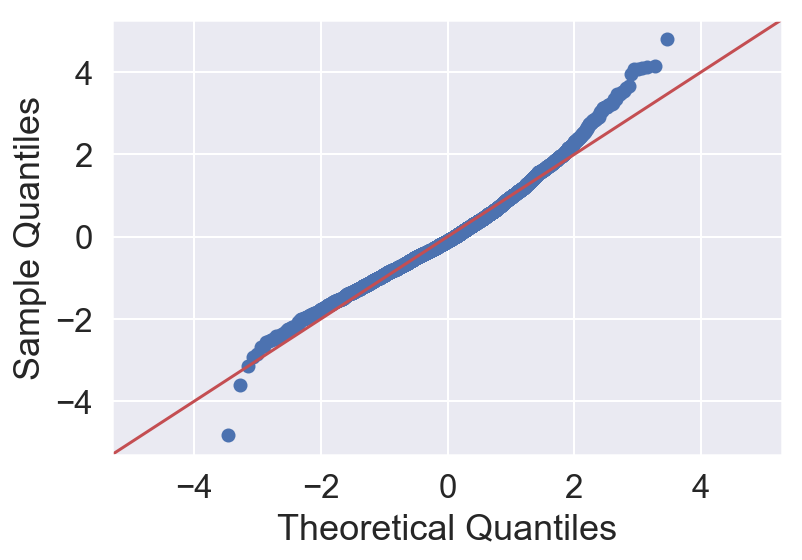

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     417.9765    346.7438
MAE     19.8384    19.2567      15.7439     14.5955
R^2      0.0000    -0.1544       0.3447      0.2287


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(2, 0, 2)x(1, 0, 2, 12)   Log Likelihood              -16715.954

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4603      0.014    104.252      0.000       1.433       1.488
ar.L2         -0.4655      0.012    -39.257      0.000      -0.489      -0.442
ma.L1         -1.0630      0.011    -94.159      0.000      -1.085      -1.041
ma.L2          0.0901      0.008     10.825      0.000       0.074       0.106
ar.S.L12       0.9988      0.001   1913.790      0.000       0.998       1.000
ma.S.L12     

QUANTILE PLOT - ALL RESIDUALS


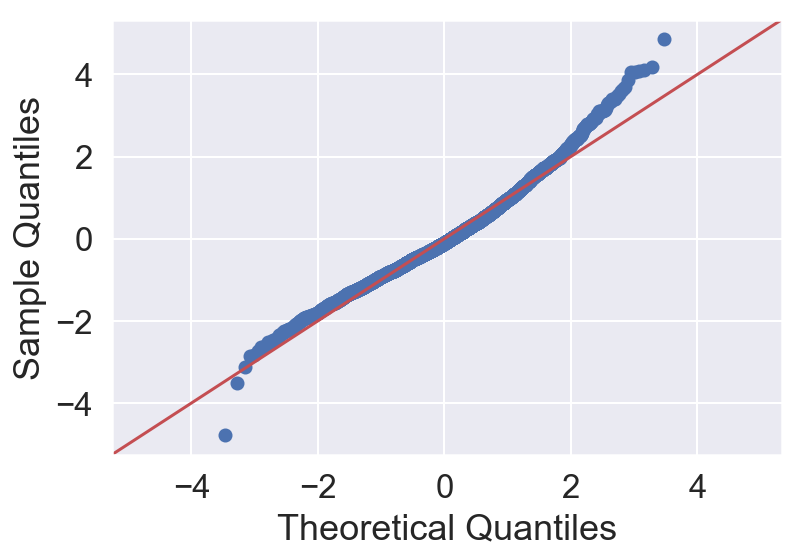

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     418.0354    347.0345
MAE     19.8384    19.2567      15.7532     14.6035
R^2      0.0000    -0.1544       0.3446      0.2280


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(2, 0, 2)x(2, 0, 1, 12)   Log Likelihood              -16716.925

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4762      0.023     64.686      0.000       1.431       1.521
ar.L2         -0.4812      0.022    -22.177      0.000      -0.524      -0.439
ma.L1         -1.0816      0.022    -48.183      0.000      -1.126      -1.038
ma.L2          0.1081      0.021      5.220      0.000       0.068       0.149
ar.S.L12       1.0496      0.015     71.373      0.000       1.021       1.078
ar.S.L24     

QUANTILE PLOT - ALL RESIDUALS


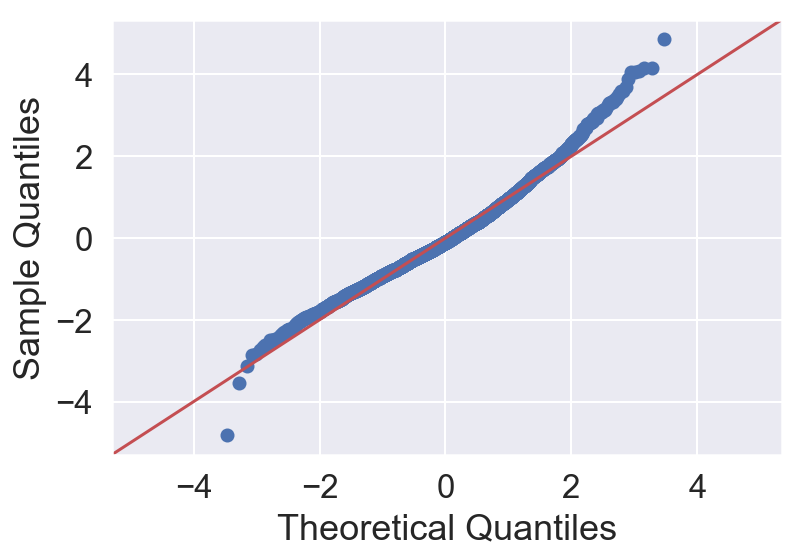

     Base_train  Base_test  Model_train  Model_test
MSE    637.8314   518.9681     420.1659    347.8777
MAE     19.8384    19.2567      15.7661     14.6582
R^2      0.0000    -0.1544       0.3413      0.2262


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                    rec_games_count   No. Observations:                 3783
Model:             SARIMAX(2, 0, 2)x(2, 0, 2, 12)   Log Likelihood              -16723.659

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3979      0.053     26.624      0.000       1.295       1.501
ar.L2         -0.4126      0.048     -8.625      0.000      -0.506      -0.319
ma.L1         -0.9973      0.055    -18.006      0.000      -1.106      -0.889
ma.L2          0.0517      0.043      1.208      0.227      -0.032       0.136
ar.S.L12       0.1135      0.120      0.943      0.346      -0.122       0.349
ar.S.L24     

QUANTILE PLOT - ALL RESIDUALS


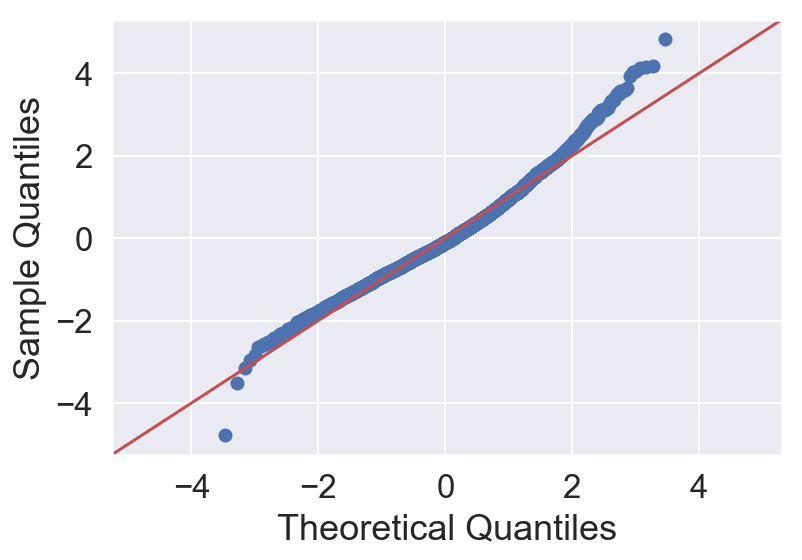

In [9]:
season=12
frequency='2H'
lag=[1,2]
ma=[1,2]

for i in lag:
    for j in ma:
        for k in lag:
            for l in ma:
                try:
                    model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILED')

In [10]:
# season=84
# frequency='2H'
# lag=[1,2]
# ma=[1,2]

# for i in lag:
#     for j in ma:
#         for k in lag:
#             for l in ma:
#                 try:
#                     model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
#                 except:
#                     print(i,j,k,l,'PARAMETERS FAILED')

     Base_train  Base_test  Model_train  Model_test
MSE   1936.8348  1526.3146    1297.7827    889.4496
MAE     34.7672    33.0035      27.8521     23.2169
R^2      0.0000    -0.2313       0.3299      0.2825


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                   rec_games_count   No. Observations:                 1892
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 6)   Log Likelihood               -9398.784

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4265      0.060      7.077      0.000       0.308       0.545
ma.L1         -0.0604      0.067     -0.908      0.364      -0.191       0.070
ar.S.L6        0.9997      0.000   5015.763      0.000       0.999       1.000
ma.S.L6       -0.9545      0.008   -121.270      0.000      -0.970      -0.939
sigma2      1268.5585     38.282     33.137      0.000    1193.527    1343.590



QUANTILE PLOT - ALL RESIDUALS


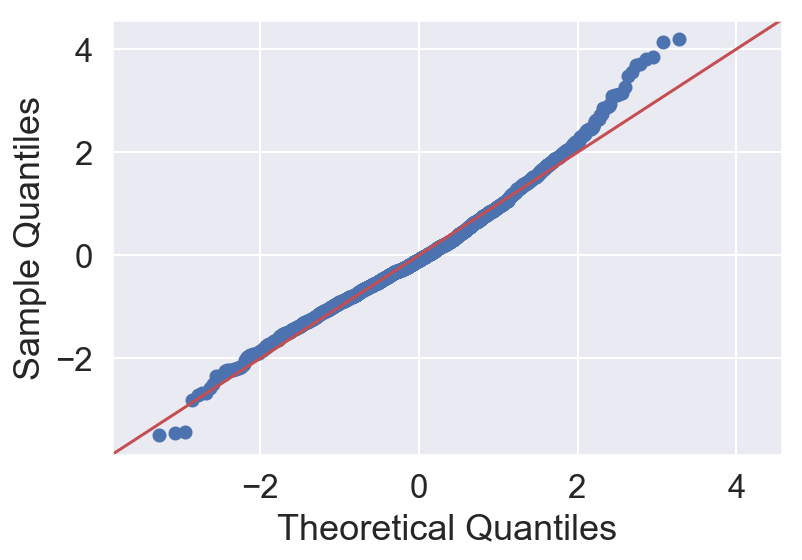

In [11]:
season=6
frequency='4H'
lag=[1]
ma=[1]

for i in lag:
    for j in ma:
        for k in lag:
            for l in ma:
                try:
                    model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILED')

In [12]:
# season=42
# frequency='4H'
# lag=[1,2]
# ma=[1,2]

# for i in lag:
#     for j in ma:
#         for k in lag:
#             for l in ma:
#                 try:
#                     model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
#                 except:
#                     print(i,j,k,l,'PARAMETERS FAILED')